<a href="https://colab.research.google.com/github/LosGala/AnalisisDelitos2022/blob/main/Analysis_Delitos_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Descargar csv de delitos en la página de Buenos Aires Data: https://data.buenosaires.gob.ar/dataset/delitos

In [5]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

In [6]:
df = pd.read_csv('/content/delitos_2022.csv')

In [7]:
df.head()

,id-mapa,anio,mes,dia,fecha,franja,tipo,subtipo,uso_arma,uso_moto,barrio,comuna,latitud,longitud,cantidad
0,1,2022,OCTUBRE,VIERNES,2022-10-14,3.0,Robo,Robo total,NO,NO,CHACARITA,15.0,-34.584136,-58.454704,1.0
1,2,2022,OCTUBRE,JUEVES,2022-10-27,5.0,Robo,Robo total,NO,NO,BARRACAS,4.0,-34.645043,-58.373194,1.0
2,3,2022,NOVIEMBRE,MARTES,2022-11-29,0.0,Robo,Robo total,NO,NO,CHACARITA,15.0,-34.589982,-58.446471,1.0
3,4,2022,NOVIEMBRE,LUNES,2022-11-28,0.0,Robo,Robo total,NO,NO,CHACARITA,15.0,-34.588320,-58.441232,1.0
4,5,2022,NOVIEMBRE,MIERCOLES,2022-11-30,3.0,Robo,Robo total,NO,NO,RECOLETA,2.0,-34.596748,-58.413609,1.0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132098 entries, 0 to 132097
Data columns (total 15 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   id-mapa   132098 non-null  int64  
 1   anio      132098 non-null  int64  
 2   mes       132098 non-null  object 
 3   dia       132098 non-null  object 
 4   fecha     132098 non-null  object 
 5   franja    132051 non-null  float64
 6   tipo      132098 non-null  object 
 7   subtipo   132098 non-null  object 
 8   uso_arma  132098 non-null  object 
 9   uso_moto  132098 non-null  object 
 10  barrio    129712 non-null  object 
 11  comuna    129710 non-null  float64
 12  latitud   129713 non-null  float64
 13  longitud  129712 non-null  float64
 14  cantidad  132097 non-null  float64
dtypes: float64(5), int64(2), object(8)
memory usage: 15.1+ MB


In [9]:
df.dtypes

id-mapa       int64
anio          int64
mes          object
dia          object
fecha        object
franja      float64
tipo         object
subtipo      object
uso_arma     object
uso_moto     object
barrio       object
comuna      float64
latitud     float64
longitud    float64
cantidad    float64
dtype: object

In [10]:
df.shape

(132098, 15)

In [11]:
df.size

1981470

In [12]:
df.isnull().sum()

id-mapa        0
anio           0
mes            0
dia            0
fecha          0
franja        47
tipo           0
subtipo        0
uso_arma       0
uso_moto       0
barrio      2386
comuna      2388
latitud     2385
longitud    2386
cantidad       1
dtype: int64

In [13]:
df = df.dropna(subset=['comuna'])

In [14]:
df.comuna = df.comuna.astype(int)

In [15]:
df.dtypes


id-mapa       int64
anio          int64
mes          object
dia          object
fecha        object
franja      float64
tipo         object
subtipo      object
uso_arma     object
uso_moto     object
barrio       object
comuna        int64
latitud     float64
longitud    float64
cantidad    float64
dtype: object

In [16]:
df.isnull().sum()

id-mapa     0
anio        0
mes         0
dia         0
fecha       0
franja      1
tipo        0
subtipo     0
uso_arma    0
uso_moto    0
barrio      0
comuna      0
latitud     0
longitud    1
cantidad    1
dtype: int64

In [17]:
df.dia.unique()

array(['VIERNES', 'JUEVES', 'MARTES', 'LUNES', 'MIERCOLES', 'SABADO',
       'DOMINGO'], dtype=object)

# **Dias **

<Axes: >

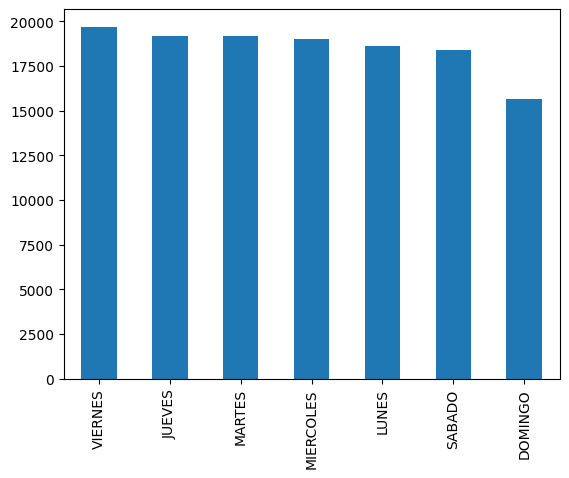

In [18]:
df.dia.value_counts().plot(kind='bar')

# Tipo de Delito


In [19]:
 df.tipo.unique()

array(['Robo', 'Hurto', 'Vialidad', 'Homicidios', 'Amenazas', 'Lesiones'],
      dtype=object)

# **Delitos por mes**

In [20]:
df3 = df.groupby(['mes'])['tipo'].count().reset_index(name='count')
df3

,mes,count
0,ABRIL,10412
1,AGOSTO,11294
2,DICIEMBRE,12349
3,ENERO,8928
4,FEBRERO,9005
5,JULIO,10946
6,JUNIO,9947
7,MARZO,10885
8,MAYO,10264
9,NOVIEMBRE,12020


# **Grafico Plotly**

In [21]:
import plotly.io as pio
pio.templates


Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

In [22]:
fig = px.bar(df3, x='mes', y='count',
             color='count',
             labels={'tipo':'Tipo Delito', 'mes':'Mes'},
             height=400,
             template='plotly_dark',
             title='Cantidad de delitos por Mes')
fig.show()

In [23]:
df4 = df.groupby(['dia'])['tipo'].count().reset_index(name='count')
df4

,dia,count
0,DOMINGO,15673
1,JUEVES,19171
2,LUNES,18637
3,MARTES,19170
4,MIERCOLES,19001
5,SABADO,18368
6,VIERNES,19690


In [24]:
fig = px.bar(df4, x='dia', y='count',
             color='count',
             labels={'tipo':'Tipo Delito', 'dia':'Dia'},
             height=400,
             template='ggplot2',
             title='Cantidad de delitos por dia')
fig.show()

In [25]:
df7 = df[(df.tipo == 'homicidio')]
df7.head()

,id-mapa,anio,mes,dia,fecha,franja,tipo,subtipo,uso_arma,uso_moto,barrio,comuna,latitud,longitud,cantidad


In [26]:
df8 = df.groupby('barrio')['tipo'].count().reset_index(name='homicidio').sort_values(by='homicidio',ascending=False)
df8.head()

,barrio,homicidio
20,PALERMO,10895
2,BALVANERA,8376
12,FLORES,7786
27,RECOLETA,5681
39,VILLA LUGANO,5660


# **CANTIDAD DE DELITOS POR BARRIO**

In [27]:
df9 = df.groupby(['barrio'])['tipo'].count().reset_index()
df10= df9[df9.tipo >= 2000]
df10.head()

,barrio,tipo
1,ALMAGRO,4719
2,BALVANERA,8376
3,BARRACAS,4571
4,BELGRANO,3819
5,BOCA,2305


# **Delitos por comuna**

In [28]:
df11 = df.groupby('comuna')['tipo'].count().reset_index().sort_values(by='tipo',ascending=False)
df11.head()

,comuna,tipo
0,1,17383
3,4,12140
13,14,10895
6,7,10859
2,3,10759


**Cuántos casos hay por tipo de delito?**

In [29]:
df13 = df['tipo'].value_counts(ascending=True).reset_index()
df13

,index,tipo
0,Homicidios,88
1,Lesiones,5111
2,Amenazas,5211
3,Vialidad,9075
4,Hurto,54111
5,Robo,56114


In [30]:
df13.columns = ['tipo','count']
df13

,tipo,count
0,Homicidios,88
1,Lesiones,5111
2,Amenazas,5211
3,Vialidad,9075
4,Hurto,54111
5,Robo,56114


In [31]:
fig = px.bar(df13, x='tipo', y='count',
             color='count',
             labels={'tipo':'Tipo Delito', 'dia':'Dia'},
             height=400,
             template='xgridoff',
             title='Cantidad de delitos')
fig.show()

# MAPA ZONAL (AREA)


In [32]:
df15 = df.groupby(['barrio','longitud','latitud'])['tipo'].count().reset_index()
df15.head( )

,barrio,longitud,latitud,tipo
0,AGRONOMIA,-58.503469,-34.593954,1
1,AGRONOMIA,-58.502289,-34.593295,1
2,AGRONOMIA,-58.502255,-34.594237,1
3,AGRONOMIA,-58.502202,-34.594449,1
4,AGRONOMIA,-58.502140,-34.593133,1


In [40]:
token = 'pk.eyJ1IjoiZ2FsYWRlcmlvMCIsImEiOiJjbHE2cWxpdTMwdnBkMmlteGhzbXJlb2pvIn0.i4agkZ2gr3O7HLaMsl16Nw'

fig= go.Figure(go.Scattermapbox(
    lon=df15.longitud,
     lat=df15.latitud,
     mode='markers+text',
    marker=go.scattermapbox.Marker(size=df15.tipo,
                                   color=df15.tipo,
                                   colorscale='Edge',
                                   showscale=True,
                                   sizemode='area', #area #cmbia los pixeles
                                   opacity=0.9),
    hoverinfo='text',
    hovertext=
    '<b>Barrio</b>:' + df15['barrio'].astype(str) + '<br>' +
    '<b>Cantidad de delitos</b>:' + df15['tipo'].astype(str) + '</br>'
))
fig.update_layout(
    hovermode='x',
    paper_bgcolor='#010915',
    plot_bgcolor='#010915',
    margin=dict(r=0, l=0, b=0, t=0),
    mapbox=dict(
        accesstoken= 'pk.eyJ1IjoiZ2FsYWRlcmlvMCIsImEiOiJjbHE3MzJvb2wweGkyMmlwZWw1aXJ2MWgxIn0.8jHj65MCuMrKix5FOxgJsQ',
        style='dark',

        zoom= 10,
        center=dict(
            lat = -34.6083,
            lon = -58.3712
        )
    ),
    showlegend = True,
    autosize=True
)